In [1]:
from custom_models.gamornet_keras_module import *
from utility.data_loading import *
import numpy as np
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.utils import plot_model
import matplotlib as mpl
import utility.initialize_tf
mpl.rcParams['figure.figsize'] = [4, 4]
mpl.rcParams['figure.dpi'] = 288

from matplotlib import pyplot as plt
plt.rcParams.update({'font.size':30})

from tensorflow.keras import Model
import keract

2.5.0
2.5.0


In [18]:
x_califa, y_califa, metadata_califa = load_hdf5_data("califa_s_1.0")
x_califa = np.expand_dims(x_califa, axis=3)
x_califa = np.expand_dims(x_califa, axis=1)


(79, 100, 100)


In [3]:
x_nair, y_nair, metadata_nair = load_hdf5_data(name="nair_abraham_2010_hdf5")
x_nair = np.expand_dims(x_nair, axis=3)
y_nair = np.expand_dims(x_nair, axis=1)


E:\Anaconda3\envs\keract\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'NYU-DR4_Object_Tag'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
E:\Anaconda3\envs\keract\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'g-r'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)


(2723, 100, 100)


In [4]:
x_sim, y_sim, metadata_sim = load_hdf5_data("fd=0.3-0.7_hdf5", count=100)
x_sim = np.expand_dims(x_sim, axis=3)
y_sim = np.expand_dims(x_sim, axis=1)

(200, 100, 100)


In [5]:
# #c2_sim_model_path = f"./saved_models/result_models/c2/simulation_psf_0.02"
# # c2_sim_model_path = f"./saved_models/trained_models/simulation_orig"

# # c2_sim_model = tf.keras.models.load_model(c2_sim_model_path, custom_objects={"LocalResponseNormalization": LocalResponseNormalization})
# gamornet_transferred_model_path = f"./saved_models/result_models/final/gamornet/transfer_learning/transferred_model_with_reg_complete.hdf5"
# gamornet_transferred_model = tf.keras.models.load_model(gamornet_transferred_model_path, custom_objects={"LocalResponseNormalization": LocalResponseNormalization})
# # c2_transferred_model_path = f"./saved_models/result_models/c2/tuned_model_val_split_0.5_mesh_100.hdf5"
# # c2_transferred_model = tf.keras.models.load_model(c2_transferred_model_path, custom_objects={"LocalResponseNormalization": LocalResponseNormalization})

In [6]:


# c2_model = Model(inputs=[c2_transferred_model.layers[1].layers[0].input], outputs=[c2_transferred_model.layers[1].layers[-1].output])
# c2_active = keract.get_activations(c2_model, x_califa[0], nested=True, layer_names=["conv2d_4"])


In [7]:

# keract.display_activations(c2_active)

In [19]:
# gamornet_transferred_model_path = f"./saved_models/result_models/final/gamornet/transfer_learning/transferred_model_with_reg_complete.hdf5"
# gamornet_transferred_model = tf.keras.models.load_model(gamornet_transferred_model_path, custom_objects={"LocalResponseNormalization": LocalResponseNormalization})

# gamornet_sim_model_path = f"./saved_models/result_models/final/gamornet/sim_with_gaussian_noise/trained_model.hdf5"
# gamornet_sim_model = tf.keras.models.load_model(gamornet_sim_model_path, custom_objects={"LocalResponseNormalization": LocalResponseNormalization})

# gamornet_untuned_model_path = f"./saved_models/result_models/final/gamornet/transferred_model_vs=0.5_skf=0.hdf5"
# gamornet_untuned_model = tf.keras.models.load_model(gamornet_untuned_model_path, custom_objects={"LocalResponseNormalization": LocalResponseNormalization})

gamornet_tuned_model_path = f"./saved_models/result_models/final/gamornet/transfer_learning/tuned_model_with_reg_complete.hdf5"

gamornet_tuned_model = tf.keras.models.load_model(gamornet_tuned_model_path, custom_objects={"LocalResponseNormalization": LocalResponseNormalization})

model = gamornet_tuned_model

#gamornet_model = Model(inputs=[model.layers[0].input], outputs=[model.layers[-1].output])
gamornet_active = keract.get_activations(model, x_califa[0], nested=True, layer_names=["conv2d_5", "conv2d_6"])# "conv2d_5", "conv2d_6"

In [22]:
# display(Classes(gamornet_model.predict(x_califa[0]).argmax(axis=1)).name)

# Classes(metadata_califa.iloc[0]['class']).name

'ES'

'ES'

In [10]:
# from sklearn.metrics import confusion_matrix
# from utility.results_helper import *
# from utility.display_prediction_results import *
# model = gamornet_sim_model
# imgs = np.zeros_like(x_califa)
# print(x_califa.shape)

# slc = slice(20, 80)
# for i in range(len(x_califa)):
#     imgs[i, slc, slc, 0] = x_califa.copy()[i, slc, slc, 0]

# plt.imshow(imgs[0])
# categories = ['E', 'ES']
# make_confusion_matrix(confusion_matrix(y_califa, model.predict(imgs).argmax(axis=1)), categories=categories, cmap='Blues', title="C2 Trained on Simulation Dataset")

ES
ES
ES


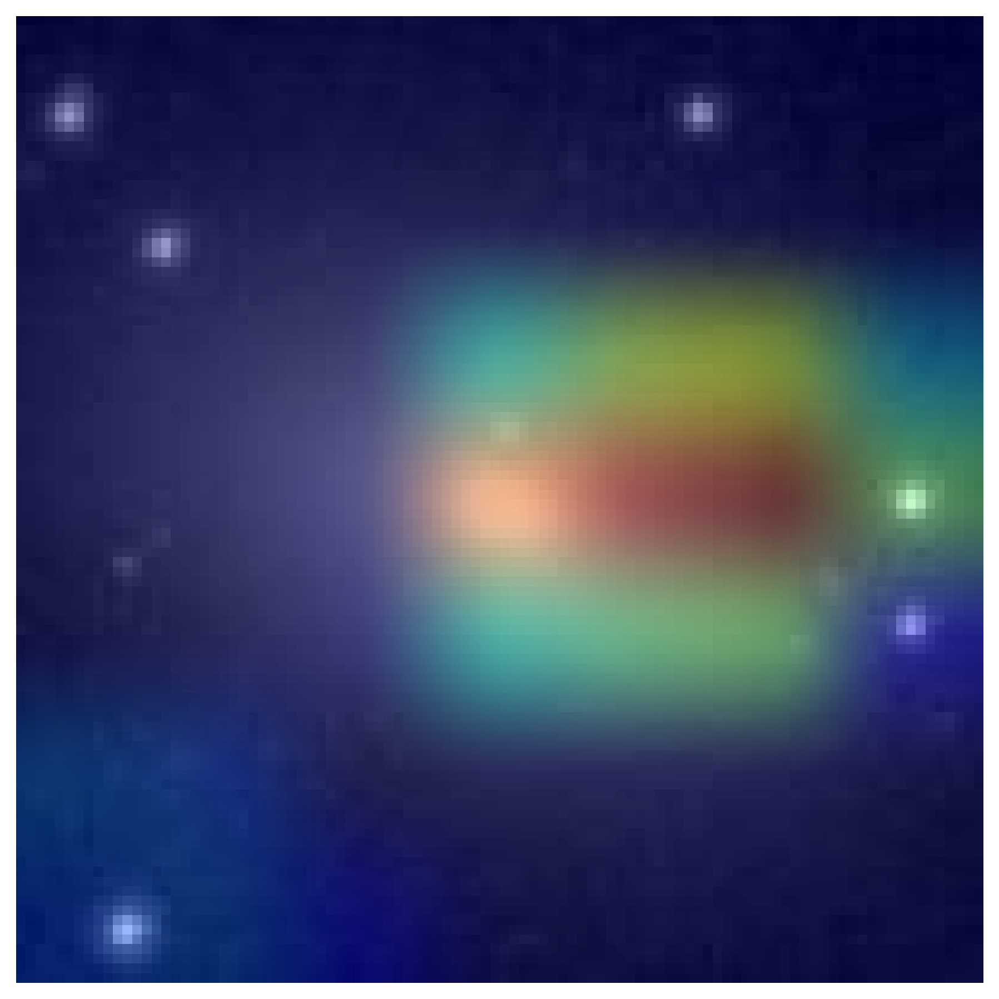

In [30]:
#gamornet_sim_model_path = f"./saved_models/result_models/final/gamornet/sim_with_gaussian_noise/trained_model.hdf5"
#gamornet_sim_model = tf.keras.models.load_model(gamornet_sim_model_path, custom_objects={"LocalResponseNormalization": LocalResponseNormalization})
#gamornet_sim_model.layers[-1].activation = None

#model = gamornet_sim_model
#model.summary()
from gradcam import *
img_index = 2
img = np.zeros((1, 100, 100, 1))
slc = slice(35, 65)
img[0, slc, slc, 0] = x_califa[img_index].copy()[0, slc, slc, 0]
#img[70:99, 70:99] = 1
print(Classes(metadata_califa.iloc[img_index]['class']).name)
print(Classes(model.predict(x_califa[img_index]).argmax(axis=1)).name)
print(Classes(model.predict(img).argmax(axis=1)).name)

model.layers[-1].activations= tf.keras.activations.linear
model = tf.keras.utils.apply_modifications(model)
#plt.imshow(x_califa[img_index].squeeze(), cmap='gray')
heatmap = make_gradcam_heatmap(x_califa[img_index], model, "conv2d_9", pred_index=Classes(model.predict(x_califa[img_index]).argmax(axis=1)))
display_gradcam(x_califa[img_index].squeeze(), heatmap)


conv2d_5 (1, 25, 25, 96) 


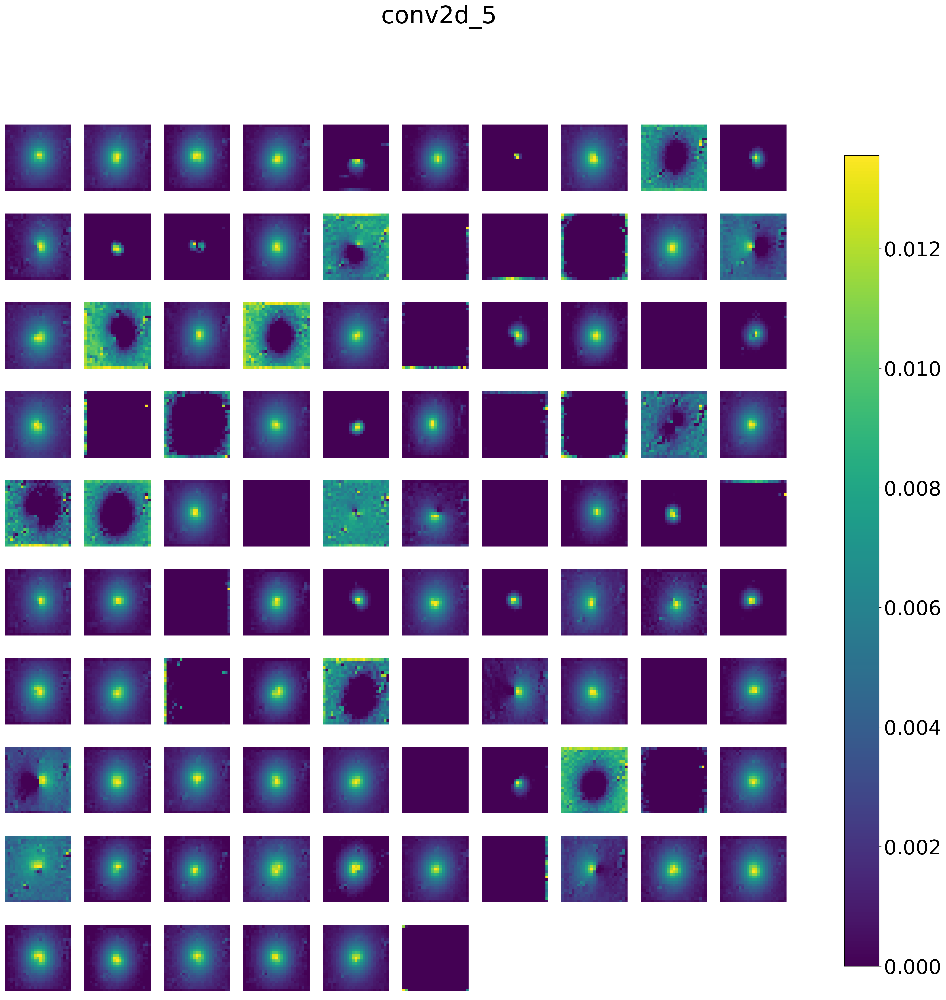

conv2d_6 (1, 13, 13, 256) 


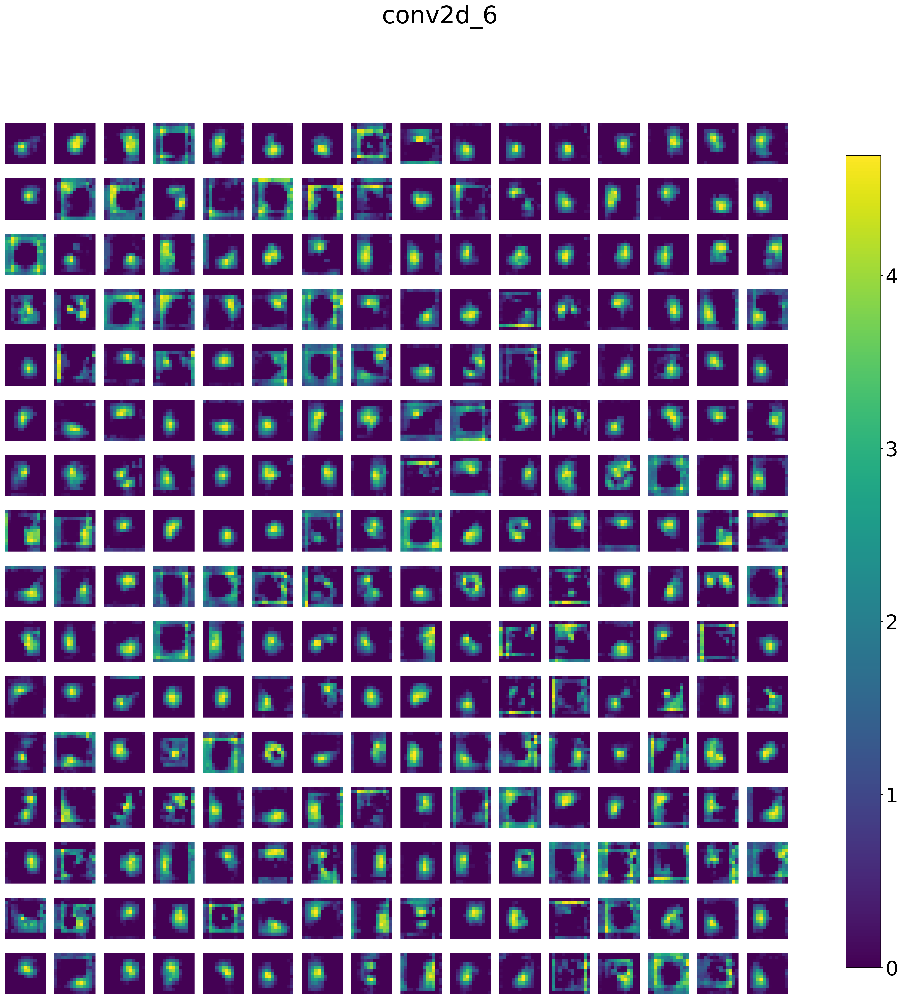

In [20]:
# mpl.rcParams['image.cmap'] = 'viridis'
# keract.display_activations(gamornet_active)

(100, 100)
conv2d_5 (1, 25, 25, 96) 


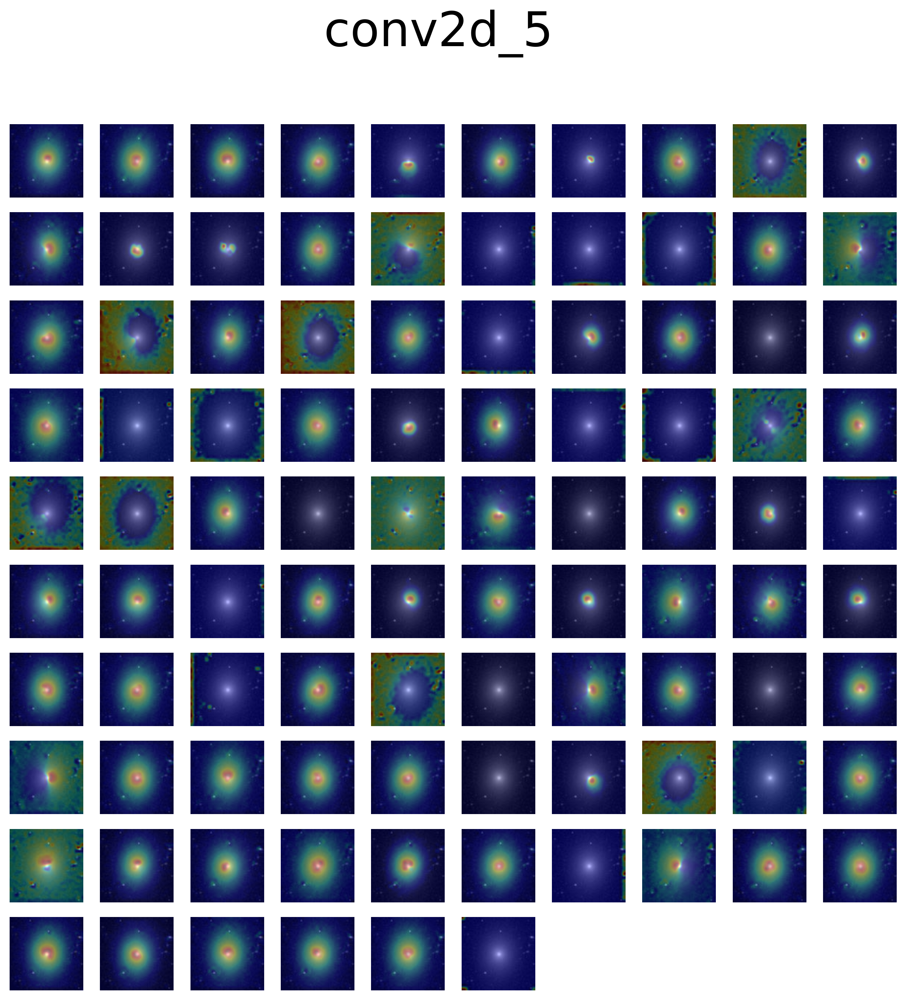

conv2d_6 (1, 13, 13, 256) 


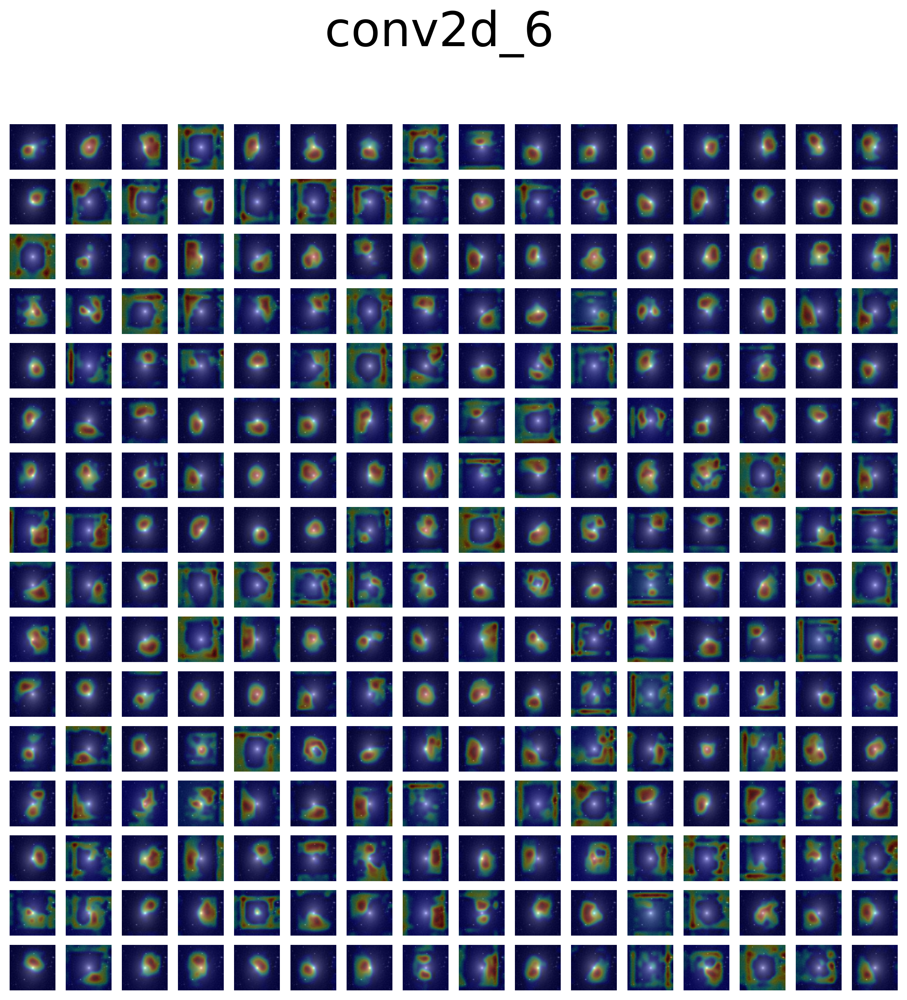

In [21]:
# print(x_califa[0].squeeze().shape)
# mpl.rcParams['figure.figsize'] = [8, 8]
# mpl.rcParams['figure.dpi'] = 288
# mpl.rcParams['image.cmap'] = 'gray'
# keract.display_heatmaps(gamornet_active, x_califa[0].squeeze(), fix=True, save=False)